In [2]:
import numpy as np # linear algebra
import pandas as pd 
import os


In [3]:
!ls img | wc -l

143818


In [4]:
!ls img | tail

fd14767e-5952-11ec-b456-cbdf60c769fa.jpg
fd1476d8-5952-11ec-b457-671e5fb87011.jpg
fd147732-5952-11ec-b458-eb420e48d424.jpg
fd14778c-5952-11ec-b459-ff0b9855c73b.jpg
fd1477e6-5952-11ec-b45a-c77dbc715bb9.jpg
fd14784a-5952-11ec-b45b-8b7b04eb67a4.jpg
fd1479da-5952-11ec-b45c-8b6bfcc59c9c.jpg
fd147a48-5952-11ec-b45d-7bb4b2df3cf7.jpg
fd147aa2-5952-11ec-b45e-0b89448a20c7.jpg
fd147afc-5952-11ec-b45f-1fc2e6e98b13.jpg


In [5]:
image_path = 'img'
df = pd.read_csv('data.csv')
df

,img_id,cam_id,seq_id,frame_id,bbox_id,x_min,x_max,y_min,y_max,label_l1,label_l2,fao_mfa,train,val,test
0,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,1,626,754,-1,88,Human,HUMAN,81,True,False,False
1,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,3,544,710,15,203,Human,HUMAN,81,True,False,False
2,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,4,629,735,210,562,Human,HUMAN,81,True,False,False
3,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,5,615,883,550,907,Human,HUMAN,81,True,False,False
4,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,6,885,962,826,875,Unknown,OTH,81,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549204,fcdecc18-5952-11ec-a87d-47788f674eed,93,15,28,126812,227,510,702,992,Yellowfin tuna,YFT,81,False,False,True
549205,fcdeef2c-5952-11ec-a8ae-cf526681fdda,93,15,77,128339,223,518,700,996,Yellowfin tuna,YFT,81,False,False,True
549206,fcdeef2c-5952-11ec-a8ae-cf526681fdda,93,15,77,128338,875,1127,668,1030,Yellowfin tuna,YFT,81,False,False,True
549207,fcdeef2c-5952-11ec-a8ae-cf526681fdda,93,15,77,128337,1069,1465,487,674,Yellowfin tuna,YFT,81,False,False,True


In [6]:
df['label_l2'].value_counts()

label_l2
HUMAN    281040
YFT      129193
ALB       81471
SKJ       22256
BET        9700
OTH        9494
BILL       6211
DOL        4425
NoF        1965
LAG        1681
TUNA        835
SHARK       809
WATER        74
PLS          51
OIL           4
Name: count, dtype: int64

In [7]:
df['label_l1'].value_counts()

label_l1
Human                      281040
Yellowfin tuna             129193
Albacore                    81471
Skipjack tuna               22256
Bigeye tuna                  9700
Unknown                      6779
Mahi mahi                    4425
Shortbill spearfish          2193
No fish                      1965
Opah                         1681
Swordfish                    1664
Striped marlin               1196
Blue marlin                   889
Tuna                          835
Shark                         808
Oilfish                       778
Wahoo                         677
Escolar                       673
Great barracuda               182
Long snouted lancetfish       176
Indo Pacific sailfish         129
Sickle pomfret                 83
Black marlin                   83
Lancetfish                     81
Water                          74
Marlin                         57
Pomfret                        54
Pelagic stingray               51
Mola mola                       6
Roudi

In [8]:
df.columns

Index(['img_id', 'cam_id', 'seq_id', 'frame_id', 'bbox_id', 'x_min', 'x_max',
       'y_min', 'y_max', 'label_l1', 'label_l2', 'fao_mfa', 'train', 'val',
       'test'],
      dtype='object')

In [9]:
img_test_name = df.loc[50,'img_id']
bboxs= df[df['img_id'] == img_test_name][['x_min', 'y_min','x_max', 'y_max']].to_numpy()
bboxs

array([[ 572,  498, 1020,  732],
       [ 499,  200,  751,  492],
       [ 313,  215,  511,  581],
       [ 226,  118,  368,  436],
       [ 543,    0,  656,  240]])

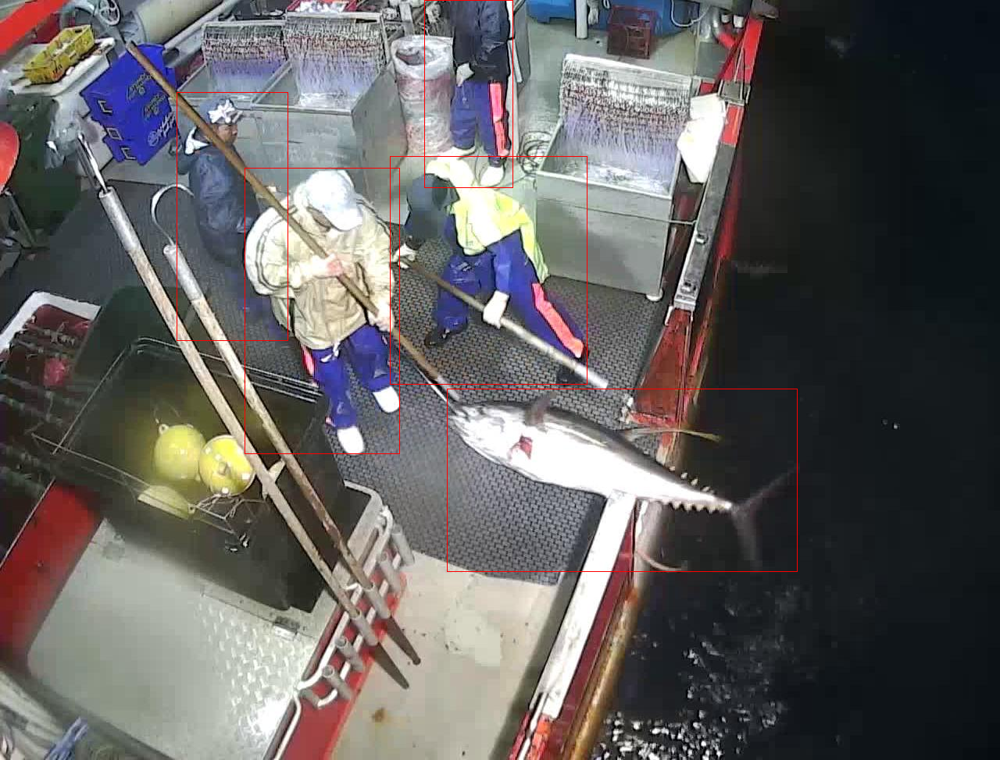

In [10]:
from PIL import Image, ImageDraw
img_test = Image.open(f'{image_path}/{img_test_name}.jpg')
img_test_draw = ImageDraw.Draw(img_test)
for bbox in bboxs:
    img_test_draw.rectangle(bbox, outline='red')
img_test

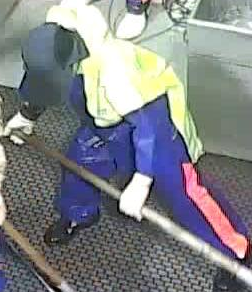

In [10]:
img_test = Image.open(f'{image_path}/{img_test_name}.jpg')
croped_image = []
for bbox in bboxs:
    croped_image.append(img_test.crop(bbox))
croped_image[1]   

In [11]:
croped_image[1].save('test.png',format='PNG')

In [12]:
import cv2 
import numpy as np 
from matplotlib import pyplot as plt 
img_rgb = cv2.imread(f'{image_path}/{img_test_name}.jpg' )
img_gray = cv2.cvtColor(np.array(img_rgb), cv2.COLOR_BGR2GRAY) 
template = cv2.imread('test.png',0) 
w, h = template.shape[::-1] 
res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED) 
threshold = 0.7 
loc = np.where( res >= threshold)
 
for pt in zip(*loc[::-1]): 
    cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 3) 
cv2.imwrite('donuts-found.jpg',img_rgb)

True

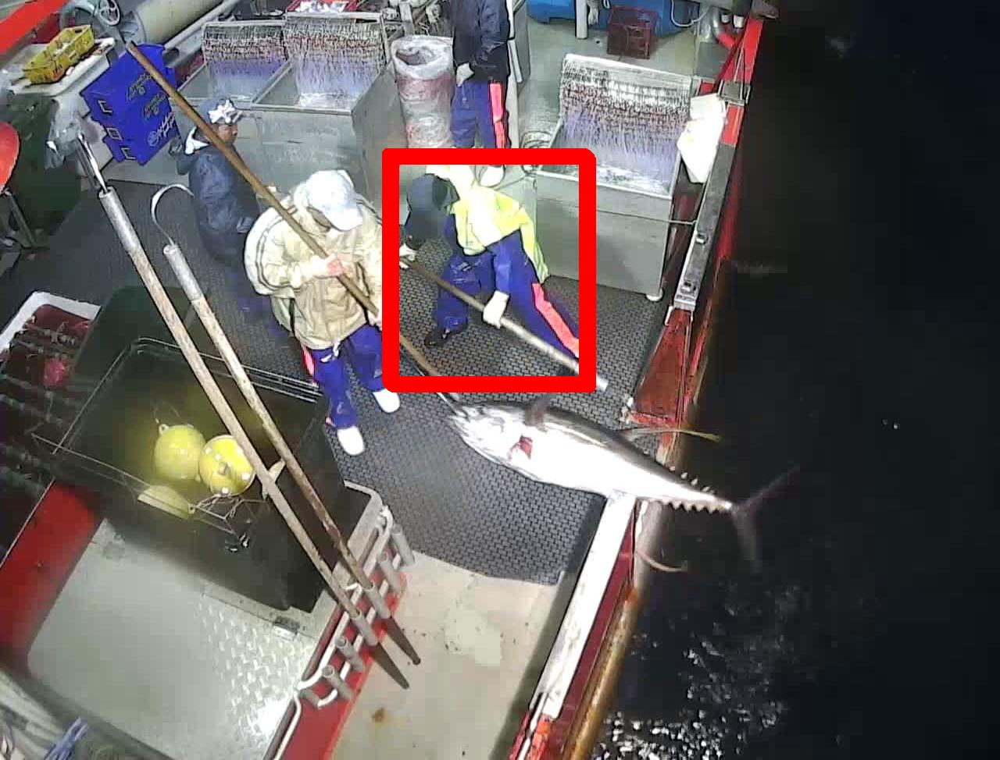

In [13]:
Image.open('donuts-found.jpg')

In [14]:
imgs_name = set(df['img_id'])
x_s,y_s = [],[]
from tqdm import tqdm
for i in tqdm(imgs_name):
    img_test = Image.open(f'{image_path}/{i}.jpg')
    x_s_e,y_s_e = img_test.size
    x_s.append(x_s_e)
    y_s.append(y_s_e)

100%|███████████████████████████████████████████████████████████| 143818/143818 [00:23<00:00, 6175.36it/s]


In [15]:
sum(x_s)/len(x_s),sum(y_s)/len(x_s)

(1481.9765119804197, 820.0277920705336)

In [16]:
img_ids = set()
for  i in df[df['train'] == True]['img_id']:
    img_ids.add(i)
    if len(img_ids) == 10000:
        break

In [17]:
from collections import defaultdict
classes = defaultdict(list)
for i in tqdm(img_ids):
    for j in df[df['img_id'] == i].iloc:
        t={
            "bbox": j[['x_min', 'y_min','x_max', 'y_max']].to_numpy(),
            'label': j['label_l2']
        }
        classes[f'{i}.jpg'].append(t)

100%|███████████████████████████████████████████████████████████████| 10000/10000 [03:33<00:00, 46.81it/s]


In [18]:
name_test =classes.keys().__iter__().__next__()

In [19]:
classes[name_test]

[{'bbox': array([277, 308, 456, 640], dtype=object), 'label': 'HUMAN'},
 {'bbox': array([385, 467, 493, 543], dtype=object), 'label': 'OTH'},
 {'bbox': array([725, 103, 841, 351], dtype=object), 'label': 'HUMAN'},
 {'bbox': array([888, 174, 1075, 477], dtype=object), 'label': 'HUMAN'}]

In [20]:
from PIL import Image, ImageOps 

In [21]:
templaets = defaultdict(list)
for k, v in tqdm(classes.items()):
    img_test = Image.open(f'{image_path}/{k}')
    for elem in v:
        img_t_gray = ImageOps.grayscale(img_test.crop(elem['bbox']))
        templaets[elem['label']].append(np.array(img_t_gray))
    

100%|██████████████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 222.29it/s]


In [22]:
templaets.keys()

dict_keys(['HUMAN', 'OTH', 'BILL', 'ALB', 'YFT', 'SHARK', 'DOL', 'NoF', 'LAG', 'SKJ', 'BET', 'TUNA', 'WATER', 'OIL'])

In [23]:
test_imgs = list(set(df[df['train'] == False]['img_id']))[:10]

In [24]:
import gc 
gc.collect()

0

In [29]:
test_imgs

['94e34f16-23f0-11e9-bbee-ff9ec5282378',
 'fc551bbc-5952-11ec-a97d-e71906c693bc',
 'fc39f4b8-5952-11ec-b527-bf63873d9c2a',
 '94f4b9e0-23f0-11e9-b756-b77b1741438c',
 'fc62410c-5952-11ec-b31c-dfa9925bd16b',
 'da92e79c-db28-11ea-9f67-abb1c73775d7',
 'fced22f4-5952-11ec-b893-07e7a76da8cc',
 '94fa8046-23f0-11e9-bcf4-2bd9c97c8280',
 '94ac105a-23f0-11e9-b555-278a5d7c5af2',
 'dad54ad8-db28-11ea-bee7-fbc1f27f70a5']

In [30]:
result = []
for img_name in test_imgs:
    img_rgb = cv2.imread(f'{image_path}/{img_name}.jpg' )
    img_gray = cv2.cvtColor(np.array(img_rgb), cv2.COLOR_BGR2GRAY) 
    threshold = 0.5
    for i in tqdm(templaets['HUMAN']):
        w, h  = i.shape[::-1] 
        res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED) 
        loc = np.where( res >= threshold)
     
        for pt in zip(*loc[::-1]): 
            cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 3) 
    result.append(img_rgb)

In [32]:
gc.collect()

33089

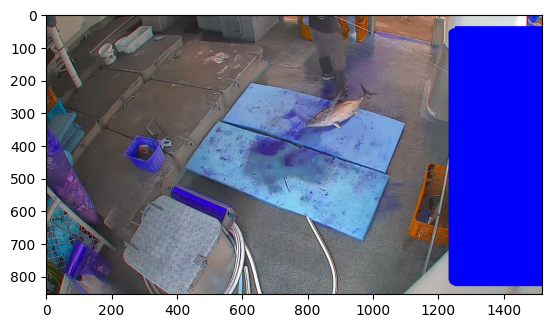

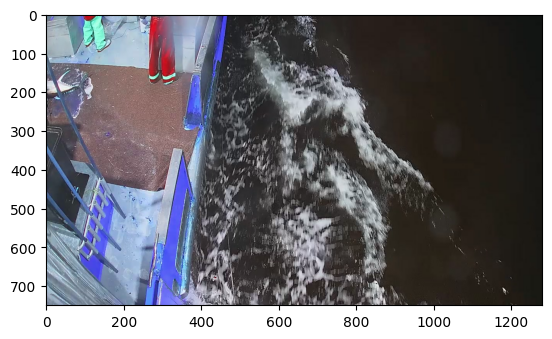

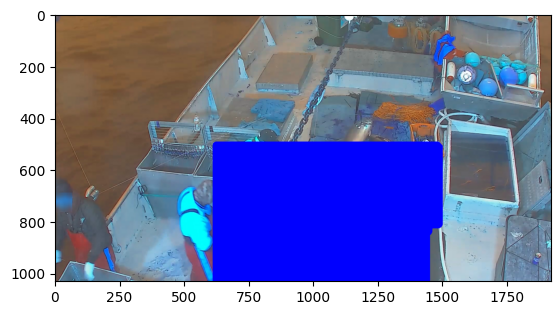

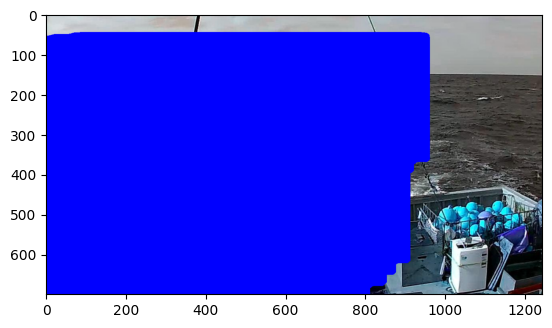

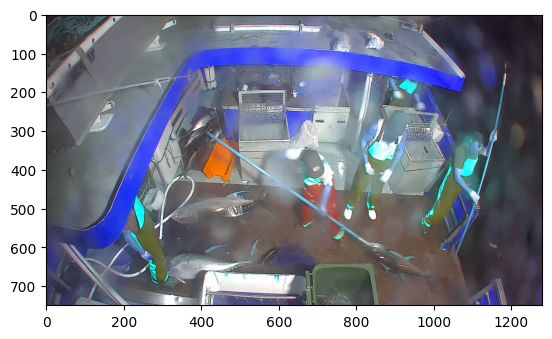

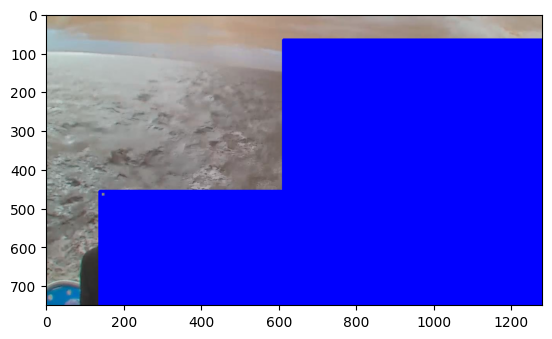

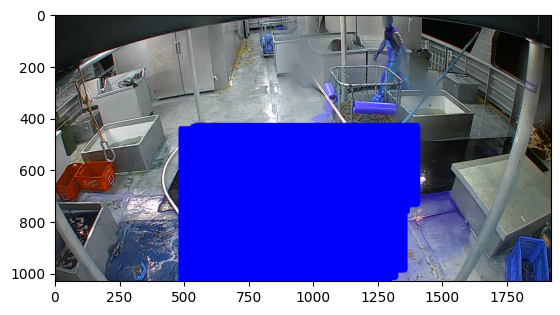

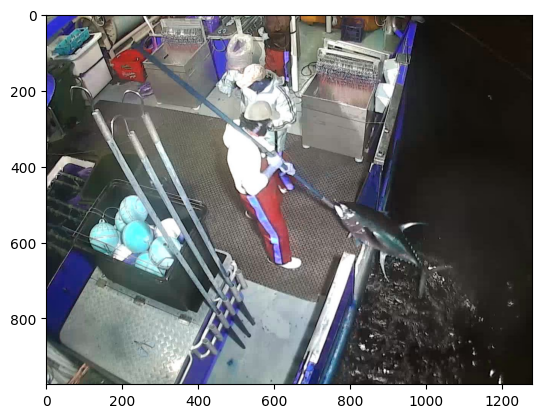

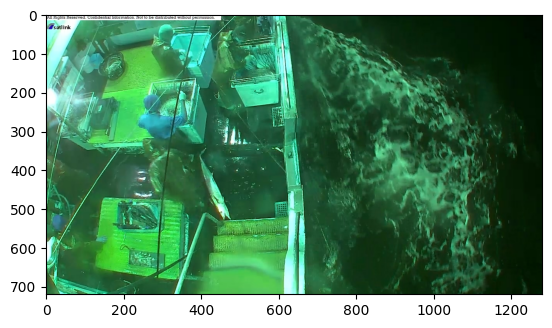

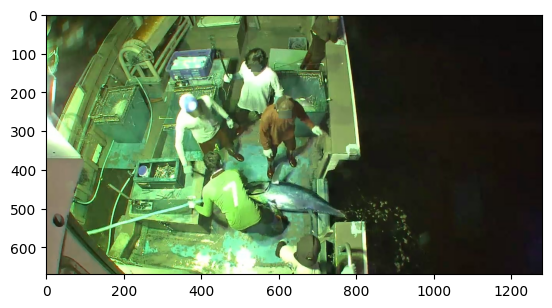

In [31]:
import matplotlib.pyplot as plt

for i in result:
    plt.imshow(Image.fromarray(i))
    plt.show()

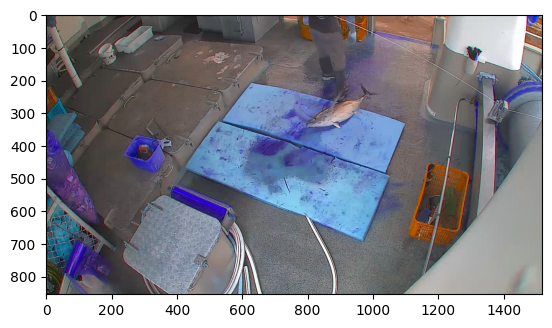

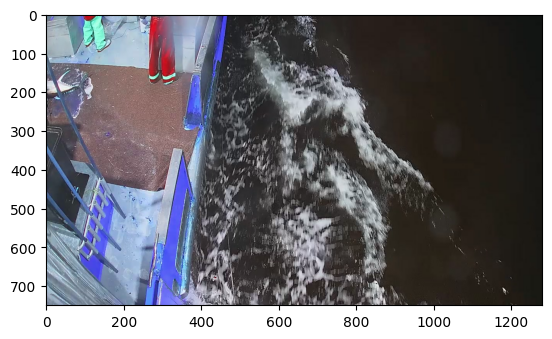

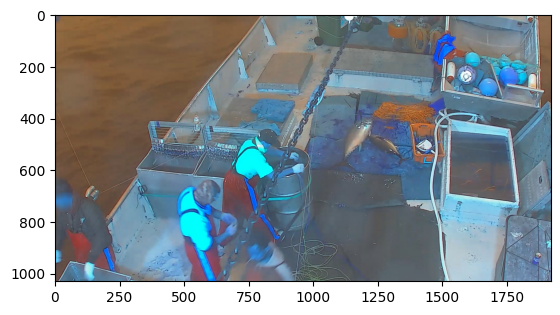

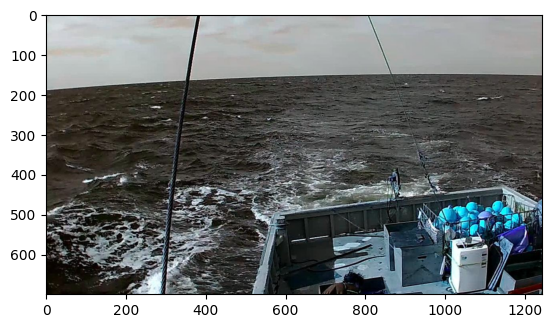

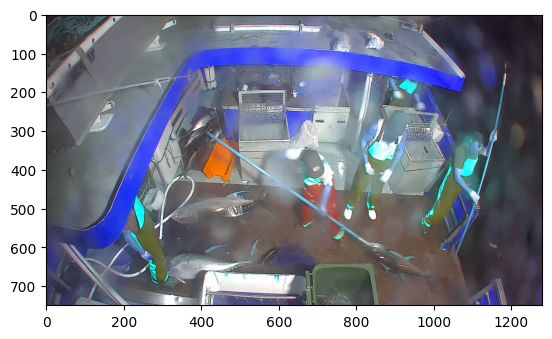

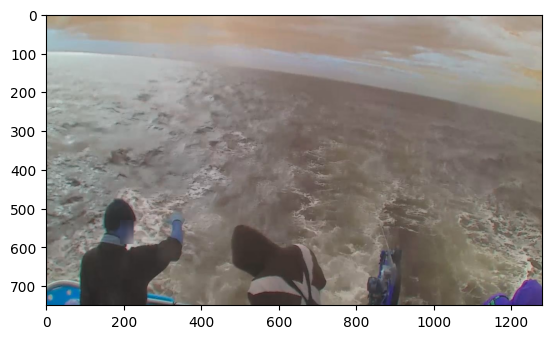

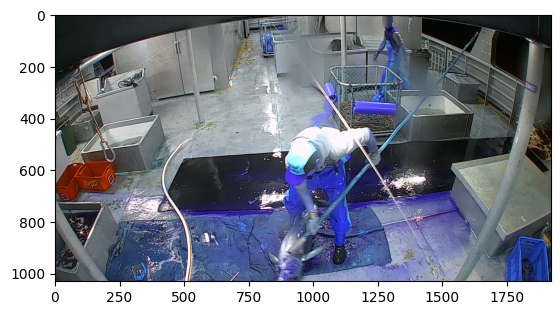

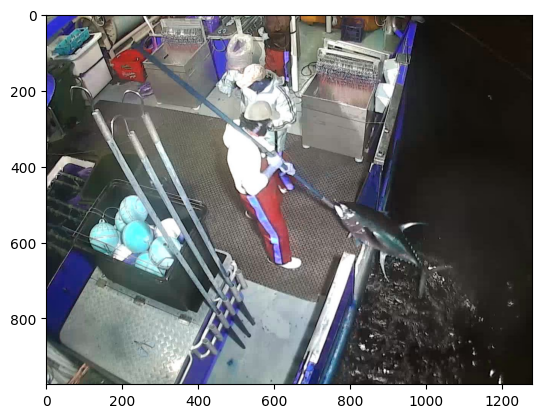

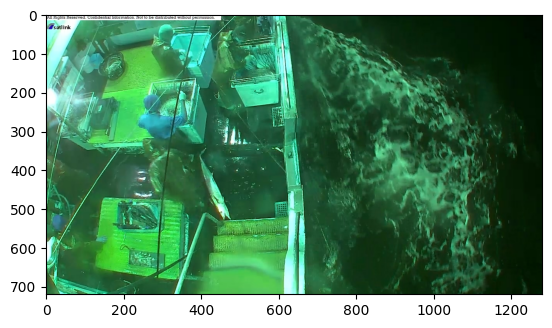

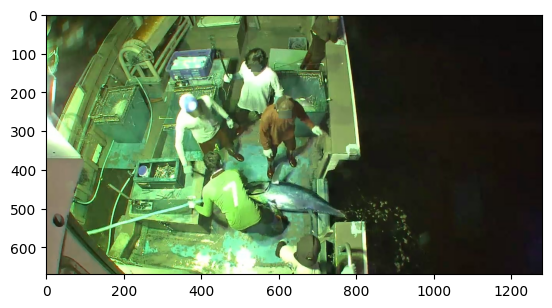

In [33]:
for img_name in test_imgs:
    img_rgb = cv2.imread(f'{image_path}/{img_name}.jpg' )
    plt.imshow(Image.fromarray(img_rgb))
    plt.show()